# Object Detection Using YOLO (Keras Implementation)

In [35]:
#First Let us import all the libraries that are required
import struct
import numpy as np
from numpy import expand_dims
from keras.layers import Conv2D
from keras.layers import Input
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from keras.layers import ZeroPadding2D
from keras.layers import UpSampling2D
from keras.layers.merge import add, concatenate
from keras.models import Model
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from matplotlib import pyplot
from matplotlib.patches import Rectangle

In [36]:
#This function is used to create convolutional layers
def _conv_block(inp, convs, skip=True):
	x = inp
	count = 0
	for conv in convs:
		if count == (len(convs) - 2) and skip:
			skip_connection = x
		count += 1
		if conv['stride'] > 1: x = ZeroPadding2D(((1,0),(1,0)))(x) # peculiar padding as darknet prefer left and top
		x = Conv2D(conv['filter'],
				   conv['kernel'],
				   strides=conv['stride'],
				   padding='valid' if conv['stride'] > 1 else 'same', # peculiar padding as darknet prefer left and top
				   name='conv_' + str(conv['layer_idx']),
				   use_bias=False if conv['bnorm'] else True)(x)
		if conv['bnorm']: x = BatchNormalization(epsilon=0.001, name='bnorm_' + str(conv['layer_idx']))(x)
		if conv['leaky']: x = LeakyReLU(alpha=0.1, name='leaky_' + str(conv['layer_idx']))(x)
	return add([skip_connection, x]) if skip else x
#'''This function define the Keras model for YOLOv3.'''
def make_yolov3_model():
	input_image = Input(shape=(None, None, 3))
	# Layer  0 => 4
	x = _conv_block(input_image, [{'filter': 32, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 0},
								  {'filter': 64, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 1},
								  {'filter': 32, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 2},
								  {'filter': 64, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 3}])
	# Layer  5 => 8
	x = _conv_block(x, [{'filter': 128, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 5},
						{'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 6},
						{'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 7}])
	# Layer  9 => 11
	x = _conv_block(x, [{'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 9},
						{'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 10}])
	# Layer 12 => 15
	x = _conv_block(x, [{'filter': 256, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 12},
						{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 13},
						{'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 14}])
	# Layer 16 => 36
	for i in range(7):
		x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 16+i*3},
							{'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 17+i*3}])
	skip_36 = x
	# Layer 37 => 40
	x = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 37},
						{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 38},
						{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 39}])
	# Layer 41 => 61
	for i in range(7):
		x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 41+i*3},
							{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 42+i*3}])
	skip_61 = x
	# Layer 62 => 65
	x = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 62},
						{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 63},
						{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 64}])
	# Layer 66 => 74
	for i in range(3):
		x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 66+i*3},
							{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 67+i*3}])
	# Layer 75 => 79
	x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 75},
						{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 76},
						{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 77},
						{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 78},
						{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 79}], skip=False)
	# Layer 80 => 82
	yolo_82 = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 80},
							  {'filter':  255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 81}], skip=False)
	# Layer 83 => 86
	x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 84}], skip=False)
	x = UpSampling2D(2)(x)
	x = concatenate([x, skip_61])
	# Layer 87 => 91
	x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 87},
						{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 88},
						{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 89},
						{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 90},
						{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 91}], skip=False)
	# Layer 92 => 94
	yolo_94 = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 92},
							  {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 93}], skip=False)
	# Layer 95 => 98
	x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True,   'layer_idx': 96}], skip=False)
	x = UpSampling2D(2)(x)
	x = concatenate([x, skip_36])
	# Layer 99 => 106
	yolo_106 = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 99},
							   {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 100},
							   {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 101},
							   {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 102},
							   {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 103},
							   {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 104},
							   {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 105}], skip=False)
	model = Model(input_image, [yolo_82, yolo_94, yolo_106])
	return model
 
#This class reads and weights from file and rather manually
#decoding the weights from yolo weights file than we can use it.    
class WeightReader:
	def __init__(self, weight_file):
		with open(weight_file, 'rb') as w_f:
			major,	= struct.unpack('i', w_f.read(4))
			minor,	= struct.unpack('i', w_f.read(4))
			revision, = struct.unpack('i', w_f.read(4))
			if (major*10 + minor) >= 2 and major < 1000 and minor < 1000:
				w_f.read(8)
			else:
				w_f.read(4)
			transpose = (major > 1000) or (minor > 1000)
			binary = w_f.read()
		self.offset = 0
		self.all_weights = np.frombuffer(binary, dtype='float32')
 
	def read_bytes(self, size):
		self.offset = self.offset + size
		return self.all_weights[self.offset-size:self.offset]
 
	def load_weights(self, model):
		for i in range(106):
			try:
				conv_layer = model.get_layer('conv_' + str(i))
				print("loading weights of convolution #" + str(i))
				if i not in [81, 93, 105]:
					norm_layer = model.get_layer('bnorm_' + str(i))
					size = np.prod(norm_layer.get_weights()[0].shape)
					beta  = self.read_bytes(size) # bias
					gamma = self.read_bytes(size) # scale
					mean  = self.read_bytes(size) # mean
					var   = self.read_bytes(size) # variance
					weights = norm_layer.set_weights([gamma, beta, mean, var])
				if len(conv_layer.get_weights()) > 1:
					bias   = self.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
					kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
					kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
					kernel = kernel.transpose([2,3,1,0])
					conv_layer.set_weights([kernel, bias])
				else:
					kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
					kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
					kernel = kernel.transpose([2,3,1,0])
					conv_layer.set_weights([kernel])
			except ValueError:
				print("no convolution #" + str(i))
 
	def reset(self):
		self.offset = 0

In [37]:
import numpy as np

class BoundBox:
    def __init__(self, xmin, ymin, xmax, ymax, objness=None, classes=None):
        self.xmin = xmin
        self.ymin = ymin
        self.xmax = xmax
        self.ymax = ymax
        self.objness = objness
        self.classes = classes
        self.label = -1
        self.score = -1

    def get_label(self):
        if self.label == -1:
            self.label = np.argmax(self.classes)
        return self.label

    def get_score(self):
        if self.score == -1:
            self.score = self.classes[self.get_label()]
        return self.score

def _sigmoid(x):
    return 1. / (1. + np.exp(-x))

def decode_netout(netout, anchors, obj_thresh, net_h, net_w):
    grid_h, grid_w = netout.shape[:2]
    nb_box = 3
    netout = netout.reshape((grid_h, grid_w, nb_box, -1))
    nb_class = netout.shape[-1] - 5
    boxes = []
    netout[..., :2] = _sigmoid(netout[..., :2])
    netout[..., 4:] = _sigmoid(netout[..., 4:])
    netout[..., 5:] = netout[..., 4][..., np.newaxis] * netout[..., 5:]
    netout[..., 5:] *= netout[..., 5:] > obj_thresh

    for i in range(grid_h * grid_w):
        row = i / grid_w
        col = i % grid_w
        for b in range(nb_box):
            objectness = netout[int(row)][int(col)][b][4]
            if objectness.all() <= obj_thresh:
                continue
            x, y, w, h = netout[int(row)][int(col)][b][:4]
            x = (col + x) / grid_w
            y = (row + y) / grid_h
            w = anchors[2 * b + 0] * np.exp(w) / net_w
            h = anchors[2 * b + 1] * np.exp(h) / net_h
            classes = netout[int(row)][col][b][5:]
            box = BoundBox(x - w / 2, y - h / 2, x + w / 2, y + h / 2, objectness, classes)
            boxes.append(box)
    return boxes

def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
    new_w, new_h = net_w, net_h
    for i in range(len(boxes)):
        x_offset, x_scale = (net_w - new_w) / 2. / net_w, float(new_w) / net_w
        y_offset, y_scale = (net_h - new_h) / 2. / net_h, float(new_h) / net_h
        boxes[i].xmin = int((boxes[i].xmin - x_offset) / x_scale * image_w)
        boxes[i].xmax = int((boxes[i].xmax - x_offset) / x_scale * image_w)
        boxes[i].ymin = int((boxes[i].ymin - y_offset) / y_scale * image_h)
        boxes[i].ymax = int((boxes[i].ymax - y_offset) / y_scale * image_h)

def _interval_overlap(interval_a, interval_b):
    x1, x2 = interval_a
    x3, x4 = interval_b
    if x3 < x1:
        if x4 < x1:
            return 0
        else:
            return min(x2, x4) - x1
    else:
        if x2 < x3:
            return 0
        else:
            return min(x2, x4) - x3

def bbox_iou(box1, box2):
    intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
    intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
    intersect = intersect_w * intersect_h
    w1, h1 = box1.xmax - box1.xmin, box1.ymax - box1.ymin
    w2, h2 = box2.xmax - box2.xmin, box2.ymax - box2.ymin
    union = w1 * h1 + w2 * h2 - intersect
    return float(intersect) / union


In [38]:
def do_nms(boxes, nms_thresh):
    if len(boxes) > 0:
        nb_class = len(boxes[0].classes)
    else:
        return
    for c in range(nb_class):
        sorted_indices = np.argsort([-box.classes[c] for box in boxes])
        for i in range(len(sorted_indices)):
            index_i = sorted_indices[i]
            if boxes[index_i].classes[c] == 0: continue
            for j in range(i+1, len(sorted_indices)):
                index_j = sorted_indices[j]
                if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:
                    boxes[index_j].classes[c] = 0


In [39]:
import matplotlib.pyplot as pyplot
from matplotlib.patches import Rectangle

def get_boxes(boxes, labels, thresh):
    v_boxes, v_labels, v_scores = list(), list(), list()
    for box in boxes:
        for i in range(len(labels)):
            if box.classes[i] > thresh:
                v_boxes.append(box)
                v_labels.append(labels[i])
                v_scores.append(box.classes[i] * 100)
    return v_boxes, v_labels, v_scores

def draw_boxes(filename, v_boxes, v_labels, v_scores):
    pyplot.figure(figsize=(20, 10))
    data = pyplot.imread(filename)
    pyplot.imshow(data)
    ax = pyplot.gca()
    
    for i in range(len(v_boxes)):
        box = v_boxes[i]
        y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
        width, height = x2 - x1, y2 - y1
        rect = Rectangle((x1, y1), width, height, fill=False, color='blue', lw=3)
        ax.add_patch(rect)
        label = "%s (%.3f)" % (v_labels[i], v_scores[i])
        pyplot.text(x1 - 20, y1 - 20, label, color='red', fontsize=16)
    
    pyplot.show()

In [40]:
# load and prepare an image
def load_image_pixels(filename, shape):
    # load the image to get its shape
    image = load_img(filename)
    width, height = image.size
    # load the image with the required size
    image = load_img(filename, target_size=shape)
    # convert to numpy array
    image = img_to_array(image)
    # scale pixel values to [0, 1]
    image = image.astype('float32')
    image /= 255.0
    # add a dimension so that we have one sample
    image = expand_dims(image, 0)
    return image, width, height

In [41]:
# define the model
model = make_yolov3_model()

In [42]:
#read weights from yolov3 weights file provided in the data
weight_reader = WeightReader('../input/data-for-model/yolov3.weights')

In [43]:
# set the model weights into the model
weight_reader.load_weights(model)

loading weights of convolution #0
loading weights of convolution #1
loading weights of convolution #2
loading weights of convolution #3
no convolution #4
loading weights of convolution #5
loading weights of convolution #6
loading weights of convolution #7
no convolution #8
loading weights of convolution #9
loading weights of convolution #10
no convolution #11
loading weights of convolution #12
loading weights of convolution #13
loading weights of convolution #14
no convolution #15
loading weights of convolution #16
loading weights of convolution #17
no convolution #18
loading weights of convolution #19
loading weights of convolution #20
no convolution #21
loading weights of convolution #22
loading weights of convolution #23
no convolution #24
loading weights of convolution #25
loading weights of convolution #26
no convolution #27
loading weights of convolution #28
loading weights of convolution #29
no convolution #30
loading weights of convolution #31
loading weights of convolution #32

In [44]:
import os

/kaggle/input/coco-dataset/000000000080.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
zebra 99.87956285476685


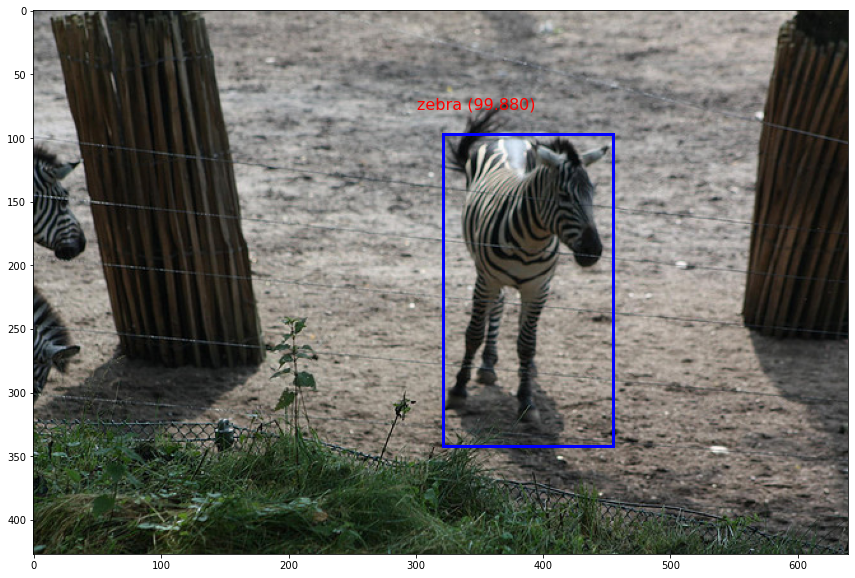

/kaggle/input/coco-dataset/000000000178.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 96.01183533668518
motorbike 99.7222900390625


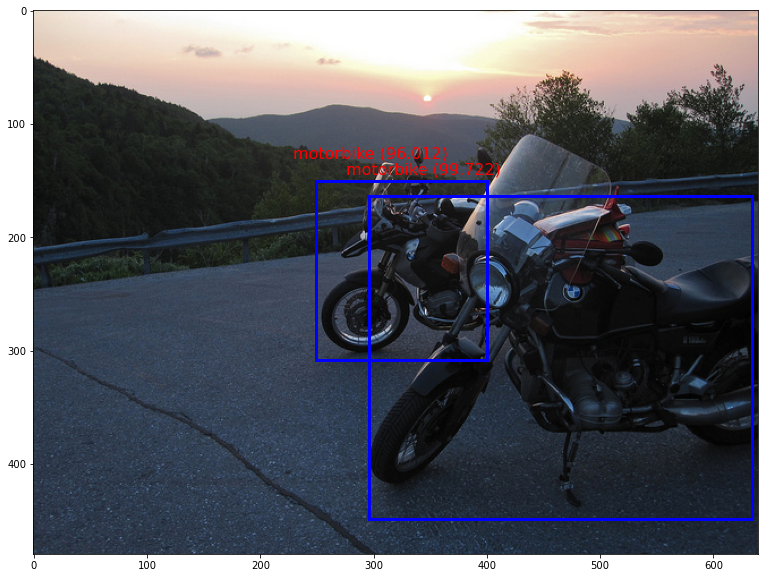

/kaggle/input/coco-dataset/000000000275.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bed 98.85432720184326
pottedplant 81.90551996231079
chair 77.81120538711548
chair 99.66369867324829
teddy bear 96.001535654068


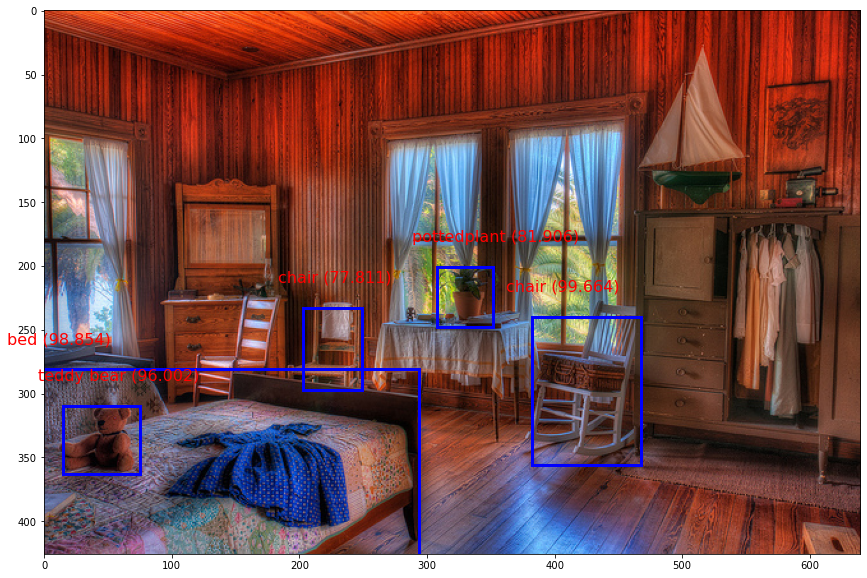

/kaggle/input/coco-dataset/000000000318.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 76.02233290672302
person 97.99489378929138
person 70.05447149276733
motorbike 72.50967621803284
person 96.17224931716919
person 87.86869049072266
person 86.18952631950378
person 97.06875085830688
person 98.82596135139465
car 97.26690649986267


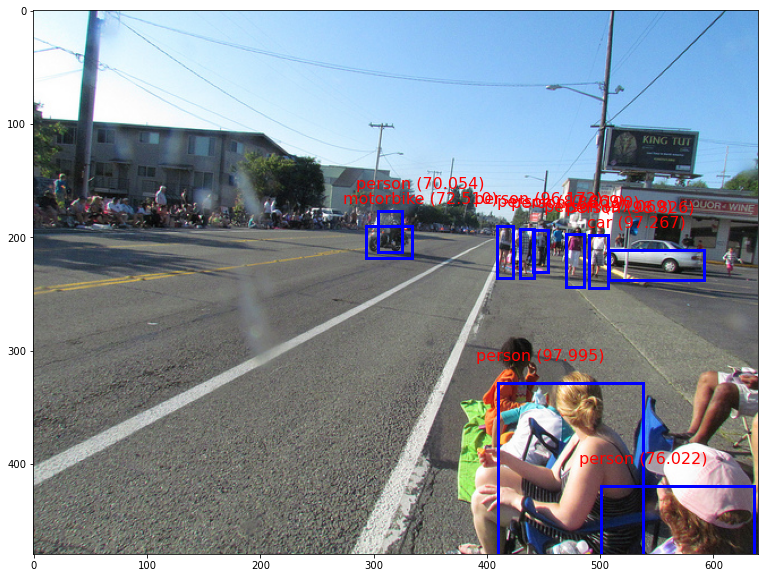

/kaggle/input/coco-dataset/000000001000.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 96.80465459823608
person 97.95295000076294
person 99.9106228351593
person 99.77813363075256
person 97.56267070770264
person 98.58711957931519
person 99.45521950721741
person 98.4648048877716
tennis racket 84.58008170127869
person 86.02741956710815


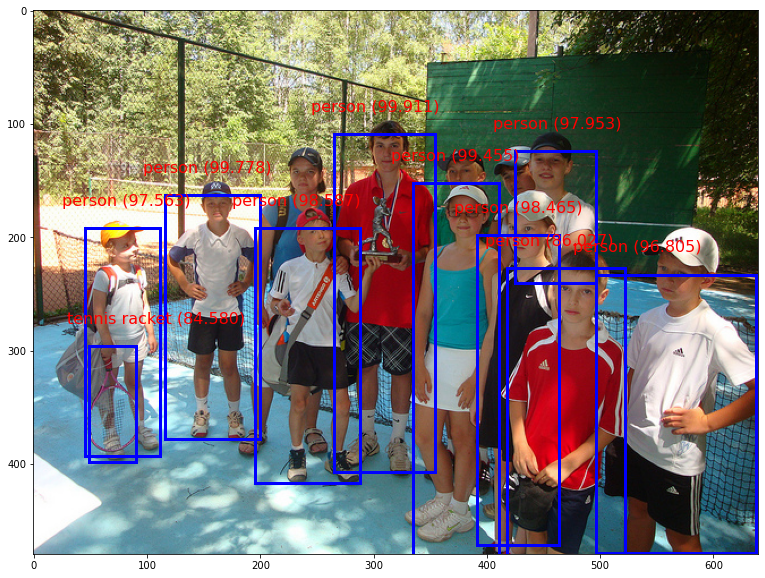

/kaggle/input/coco-dataset/000000002157.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
cake 99.00152087211609
diningtable 99.10462498664856
knife 98.67489337921143
wine glass 83.02360773086548
wine glass 99.24255609512329
wine glass 72.10087180137634
wine glass 89.57059383392334
wine glass 99.85092878341675
wine glass 99.67166781425476
wine glass 74.70974922180176


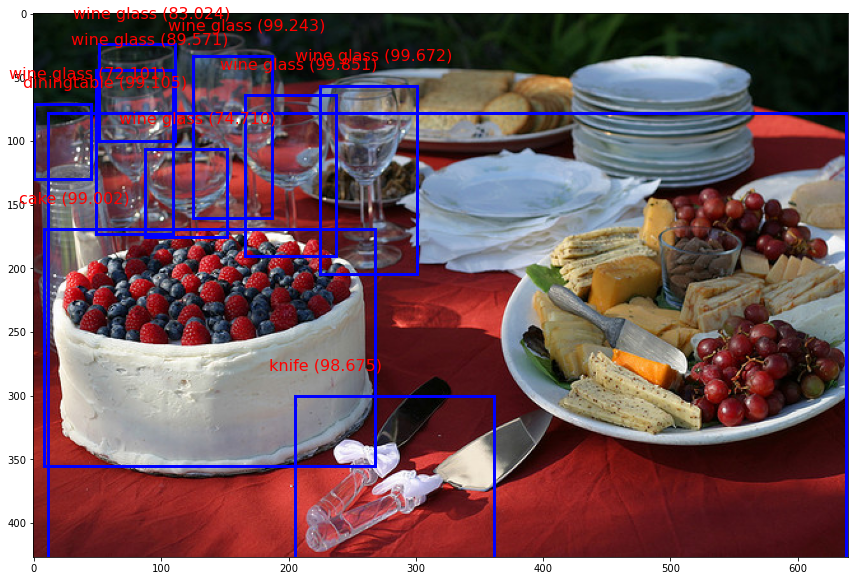

/kaggle/input/coco-dataset/000000002299.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 88.78270387649536
person 79.10557389259338
person 70.70976495742798
person 98.80638122558594
person 89.20465111732483
person 88.56661915779114
person 90.62705039978027
person 97.1224308013916
person 93.83542537689209
person 78.86789441108704
person 85.7573390007019
person 81.28904700279236
person 79.0454626083374
person 85.39353609085083
person 92.80016422271729
person 86.18031144142151
person 74.1066038608551
person 90.9978449344635
person 76.36862993240356
person 90.56811332702637
person 93.9212441444397
person 93.87244582176208
person 97.0592737197876
person 96.6287612915039
person 88.66573572158813
person 98.75602722167969
person 81.15627765655518
person 95.63928842544556
person 96.4440643787384
person 99.89096522331238
person 99.83225464820862
person 98.3319342136383
person 99.20195937156677
person 99.85283017158508
person 99.82113838195801


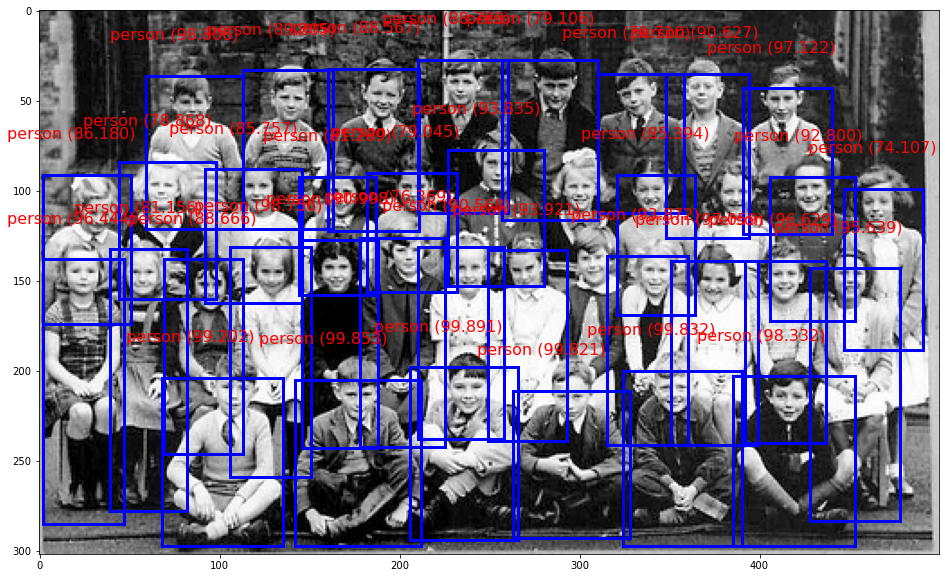

/kaggle/input/coco-dataset/000000000212.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.90957379341125
person 98.76907467842102
skateboard 99.21066164970398


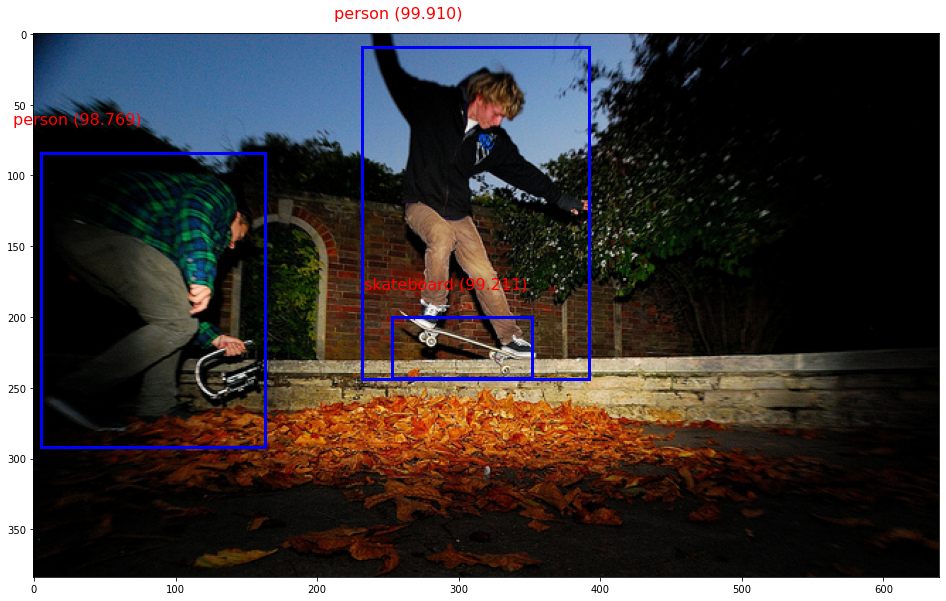

/kaggle/input/coco-dataset/000000000069.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.91348385810852
person 99.88166689872742
person 98.53259325027466
wine glass 98.94180297851562
wine glass 97.88581132888794
wine glass 99.68583583831787
bottle 74.80064034461975
bottle 73.60637187957764


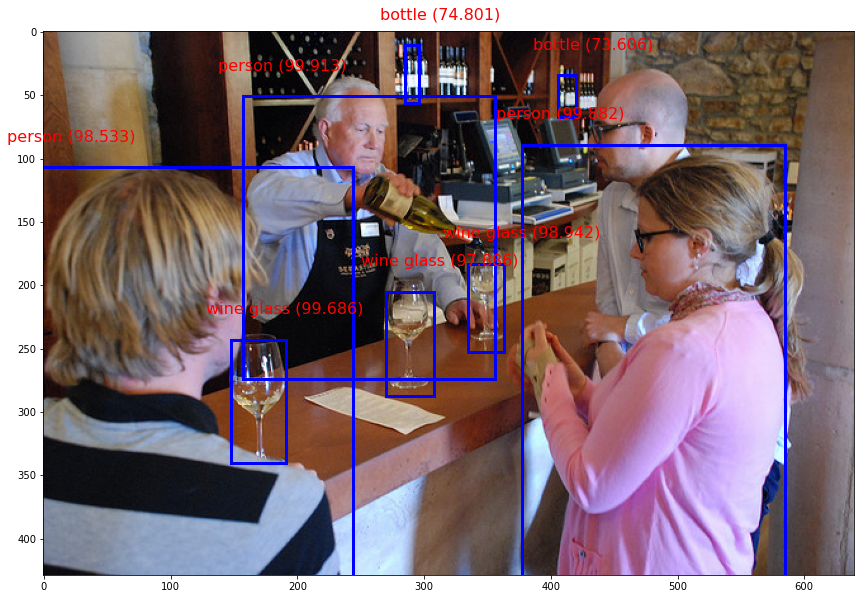

/kaggle/input/coco-dataset/000000002157 (1).jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
cake 99.00152087211609
diningtable 99.10462498664856
knife 98.67489337921143
wine glass 83.02360773086548
wine glass 99.24255609512329
wine glass 72.10087180137634
wine glass 89.57059383392334
wine glass 99.85092878341675
wine glass 99.67166781425476
wine glass 74.70974922180176


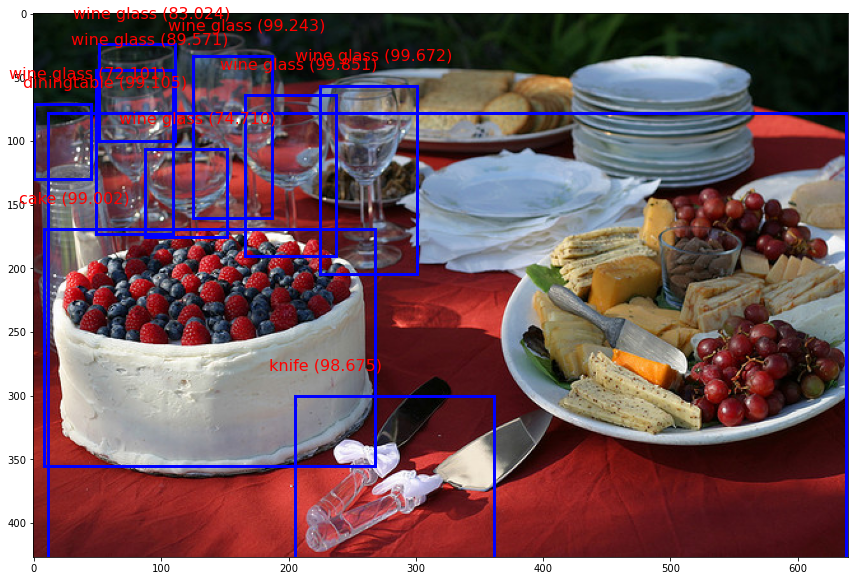

/kaggle/input/coco-dataset/000000000191.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
aeroplane 99.6998131275177


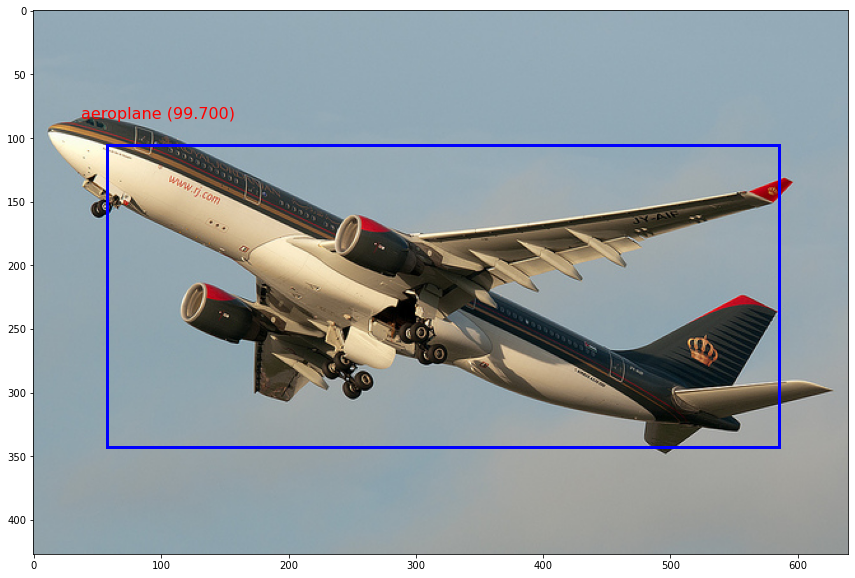

/kaggle/input/coco-dataset/000000000632.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bed 99.32019114494324
pottedplant 90.70878028869629
chair 99.53914284706116
pottedplant 99.2360532283783
bottle 83.44877362251282
book 70.07290720939636


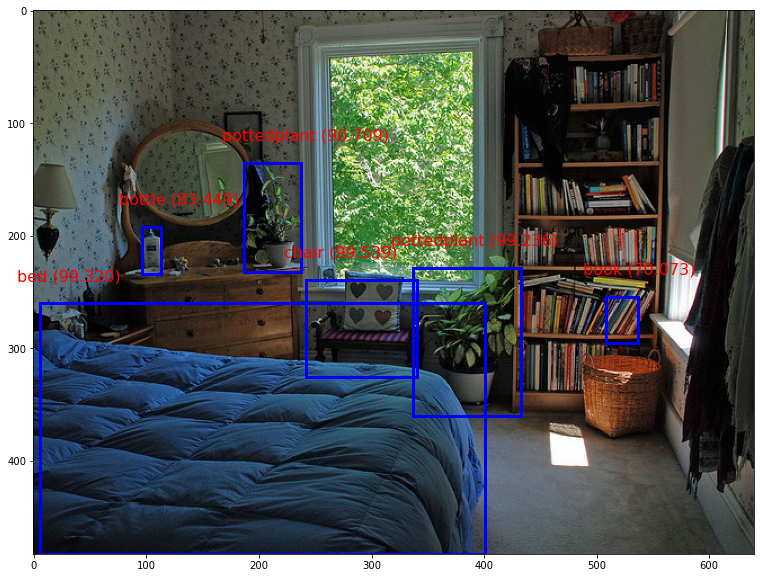

/kaggle/input/coco-dataset/000000001584.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 73.89478087425232
bus 99.5009183883667
bus 95.26547193527222
bus 96.8275785446167
person 97.50763177871704
person 90.00909328460693


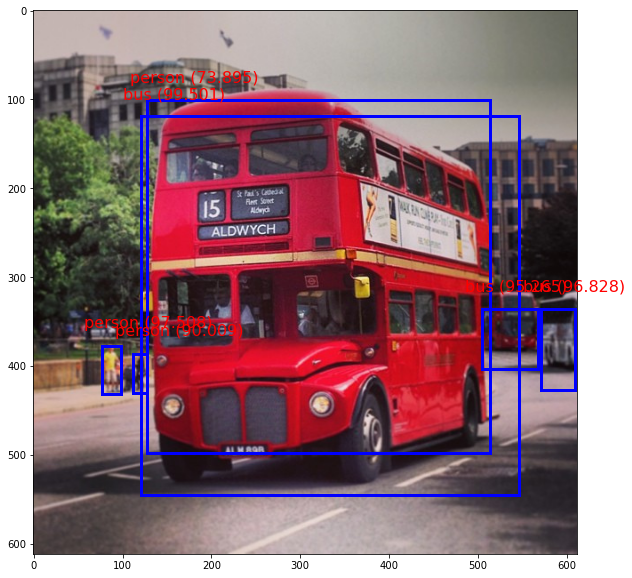

/kaggle/input/coco-dataset/000000000183.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
diningtable 99.938303232193
hot dog 98.72345924377441
bottle 97.87062406539917
wine glass 99.87409114837646


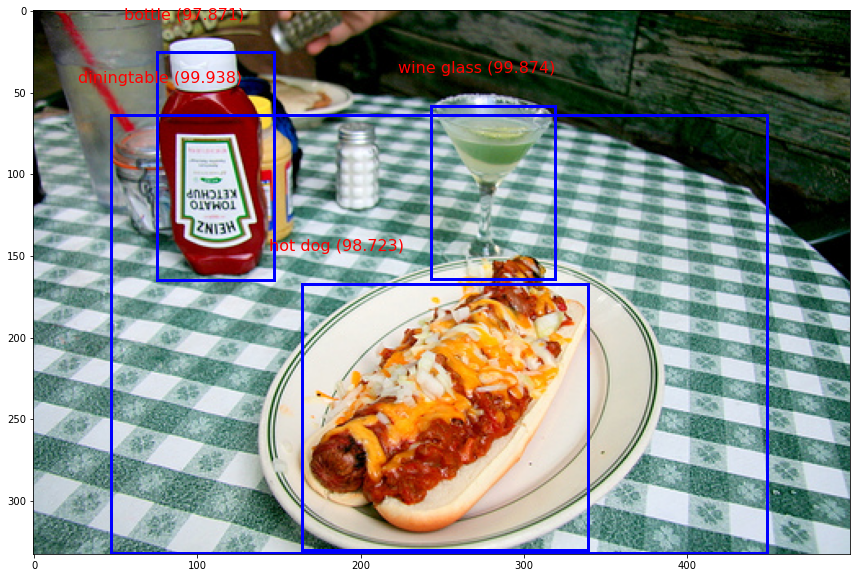

/kaggle/input/coco-dataset/000000000311.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
clock 97.66125679016113


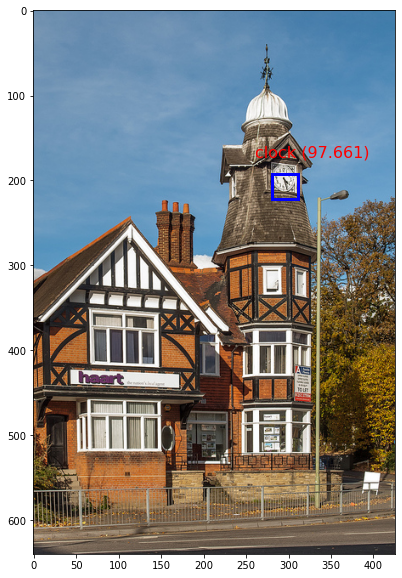

/kaggle/input/coco-dataset/000000000885.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.71033930778503
person 97.72165417671204
person 81.1506986618042
tennis racket 99.82830286026001
person 86.3574743270874
person 77.26737260818481


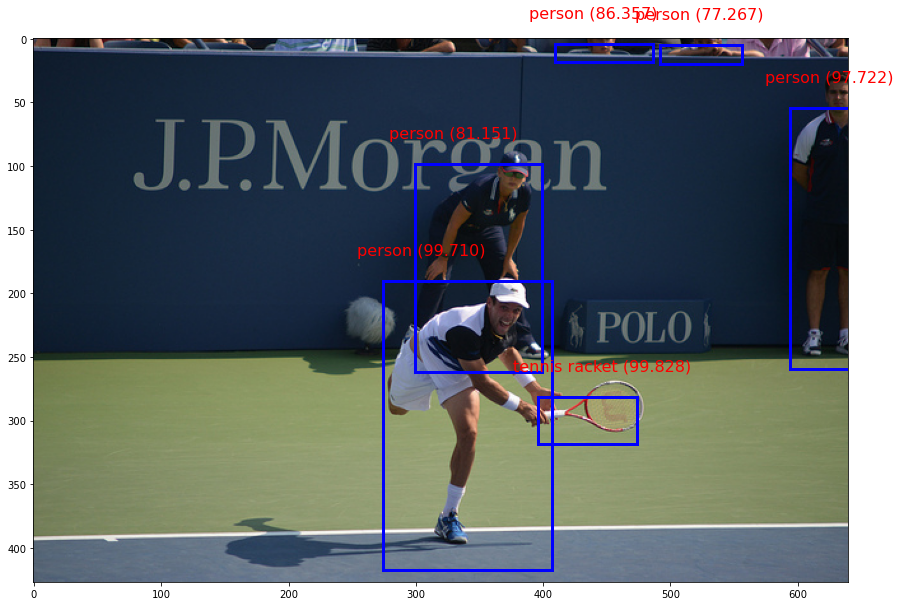

/kaggle/input/coco-dataset/000000002473.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 98.80877137184143
skis 92.49663949012756
person 97.56311774253845
person 92.11596846580505
person 99.32386875152588


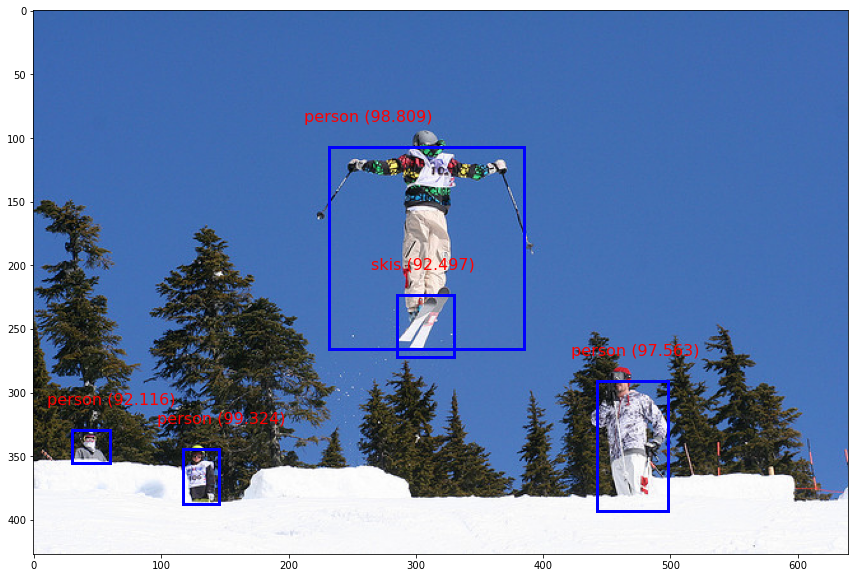

/kaggle/input/coco-dataset/000000002153.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 98.19690585136414
person 96.56844139099121
baseball bat 98.10274839401245
person 89.89846110343933
person 97.5180983543396


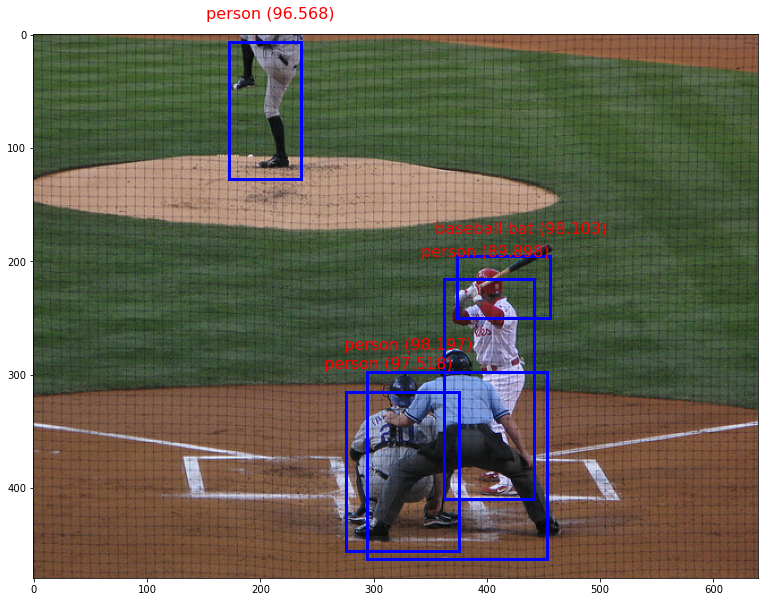

/kaggle/input/coco-dataset/000000000872.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 95.35524249076843
person 99.97907280921936


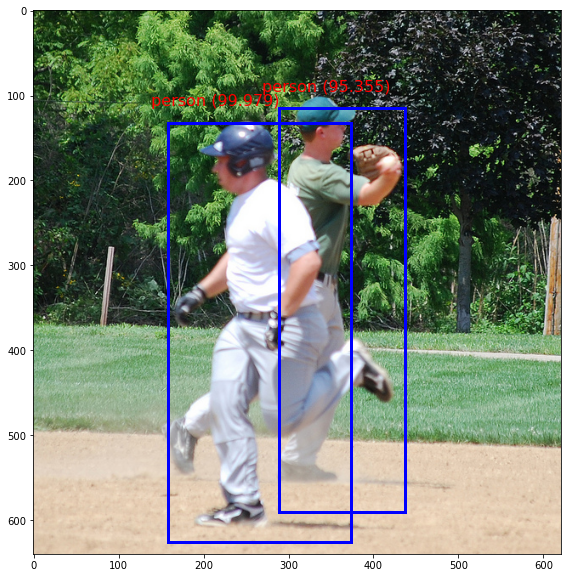

/kaggle/input/coco-dataset/000000000724.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
stop sign 99.9706506729126
stop sign 79.27541136741638


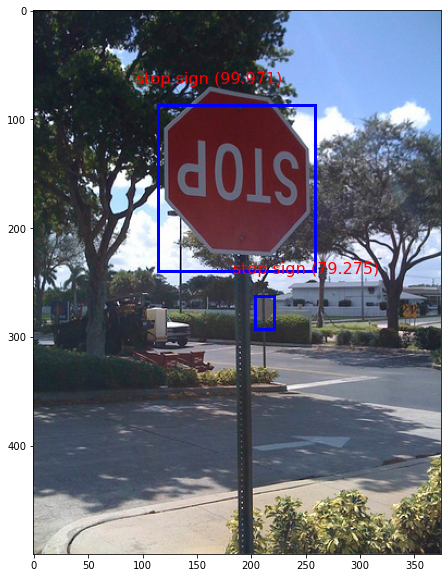

/kaggle/input/coco-dataset/000000000139.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 99.8220682144165
person 76.77828669548035
tvmonitor 93.79596710205078
chair 99.13054704666138
chair 80.71049451828003
chair 87.46408224105835
vase 72.05520272254944


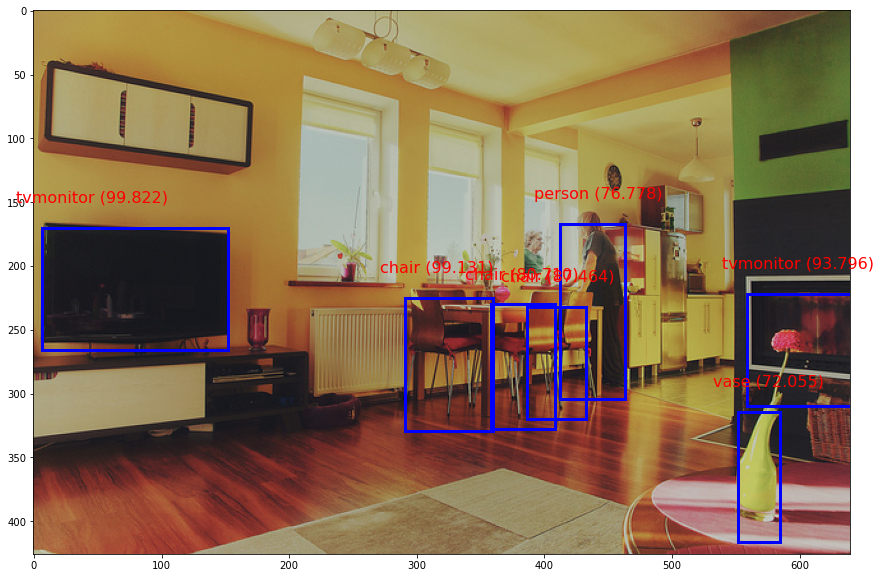

/kaggle/input/coco-dataset/000000001296.jpg
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 93.65915060043335
person 99.96185302734375
cell phone 94.27574276924133


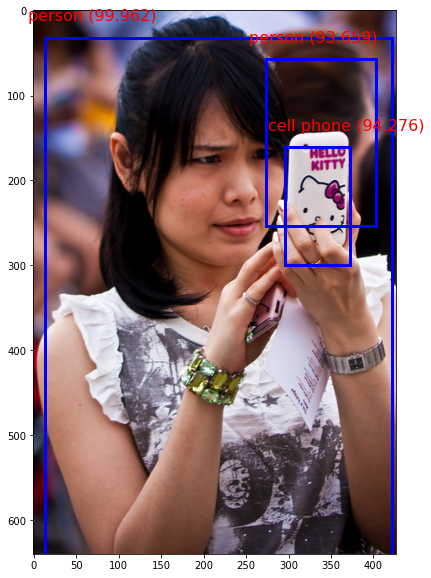

In [45]:
# define the expected input shape for the model
input_w, input_h = 416, 416
# define our new photo
dataset_folder = "/kaggle/input/coco-dataset"

for filename in os.listdir(dataset_folder):
    if filename.endswith(('.jpg')):  # Filter only image files
        # Construct the full path to the image
        image_path = os.path.join(dataset_folder, filename)
        # load and prepare image
        print(image_path)
        image, image_w, image_h = load_image_pixels(image_path, (input_w, input_h))
        # make prediction
        yhat = model.predict(image)
        # summarize the shape of the list of arrays
        print([a.shape for a in yhat])
        # define the anchors
        anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
        # define the probability threshold for detected objects
        class_threshold = 0.7
        boxes = list()
        for i in range(len(yhat)):
            # decode the output of the network
            boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, input_h, input_w)
        # correct the sizes of the bounding boxes for the shape of the image
        correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)
        # suppress non-maximal boxes
        do_nms(boxes, 0.4)
        # define the labels
        labels = []
        with open("../input/data-for-model/coco.names", "r") as f:
            labels = [line.strip() for line in f.readlines()]
        v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
        # summarize what we found
        for i in range(len(v_boxes)):
            print(v_labels[i], v_scores[i])
        # draw what we found
        draw_boxes(image_path, v_boxes, v_labels, v_scores)